# EDA Part 2 - Word Clouds

## Cleaning and Plotting Text Data By Industry

In [2]:
# importing libraries
import pymongo
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import string
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from collections import Counter
from nltk.collocations import *
from operator import itemgetter
from wordcloud import WordCloud
from textblob import TextBlob
from tqdm import tqdm_notebook as tq

In [3]:
# importing data
headlines = pd.read_csv('headlines_df.csv')

In [4]:
headlines.head()

,brand,country,medium,headline,industry
0,Tzabar,Israel,Print,roger waters live in paris 3 nights concert €...,Transport & Tourism
1,Infiniti,United States,Print,accelerating the future,Automotive & Services
2,Toyota,Canada,Print,official ride of the spinfest amateur dj awards,Automotive & Services
3,Friends of the Earth,Germany,Print,travelling fruits cause pollution think global...,Public interest & Non-profit
4,Max Factor,Colombia,Print,the art of beauty,Beauty & Health


In [5]:
headlines.industry.value_counts()

Public interest & Non-profit                 3881
Food & Beverages                             2442
Automotive & Services                        2316
Professional & Public services               1970
House, Garden & Pets                         1641
Media & Publishing                           1608
Culture, Recreation & Sport                  1384
Electronics & Audio-Visual                   1334
Apparel, Clothing, Footwear & Accessories    1169
Beauty & Health                              1117
Retail & Distribution                         825
Financial & Legal services                    776
Transport & Tourism                           766
Pharmaceutical                                730
Alcoholic drinks                              688
Education                                     452
Industrial & Agricultural                     390
Toys & Games                                  288
Internet sites & Services                     232
Office equipment                              180


In [6]:
# setting up stopwords
stop_words = stopwords.words('english')
stop_words += ['1','2','3','4','5','6','7','8','9','0']

In [7]:
# tokenize, removing stop words, lemmatizing and stemming
words = headlines.loc[headlines.industry == 'Public interest & Non-profit', 'headline'].ravel()
tokens = []
for word in words:
    token = word_tokenize(word)
    tokens+=token
stopped = [word for word in tokens if word not in stop_words]
lemmatizer = nltk.stem.WordNetLemmatizer()
lemmas = []
for word in stopped:
    if word != 'us':
        lemma = lemmatizer.lemmatize(word)
        lemmas.append(lemma)
    else:
        lemmas.append(word)
common_words = Counter(lemmas).most_common(100)

In [8]:
# creating bigrams and trigrams
bigrams = nltk.collocations.BigramAssocMeasures()
bi_finder = BigramCollocationFinder.from_words(lemmas)
bi_scored = bi_finder.score_ngrams(bigrams.raw_freq)
trigrams = nltk.collocations.TrigramAssocMeasures()
tri_finder = TrigramCollocationFinder.from_words(lemmas)
tri_scored = tri_finder.score_ngrams(trigrams.raw_freq)

In [9]:
# processing bigrams and trigrams so they can be put into word clouds
bi_scored_sort = sorted(bi_scored, key=itemgetter(1), reverse=True)
tri_scored_sort = sorted(tri_scored, key=itemgetter(1), reverse=True)
word_freq_dict = {}
bi_freq_dict = {}
tri_freq_dict = {}
for i in range(len(common_words)):
    word_freq_dict[common_words[i][0]] = common_words[i][1]
for i in range(len(bi_scored_sort)):
    bi_freq_dict[' '.join(bi_scored_sort[i][0])] = bi_scored_sort[i][1]
for i in range(len(tri_scored_sort)):
    text = ' '.join(tri_scored_sort[i][0])
    if 'longxi' in text:
        pass
    else:
        tri_freq_dict[text] = tri_scored_sort[i][1]

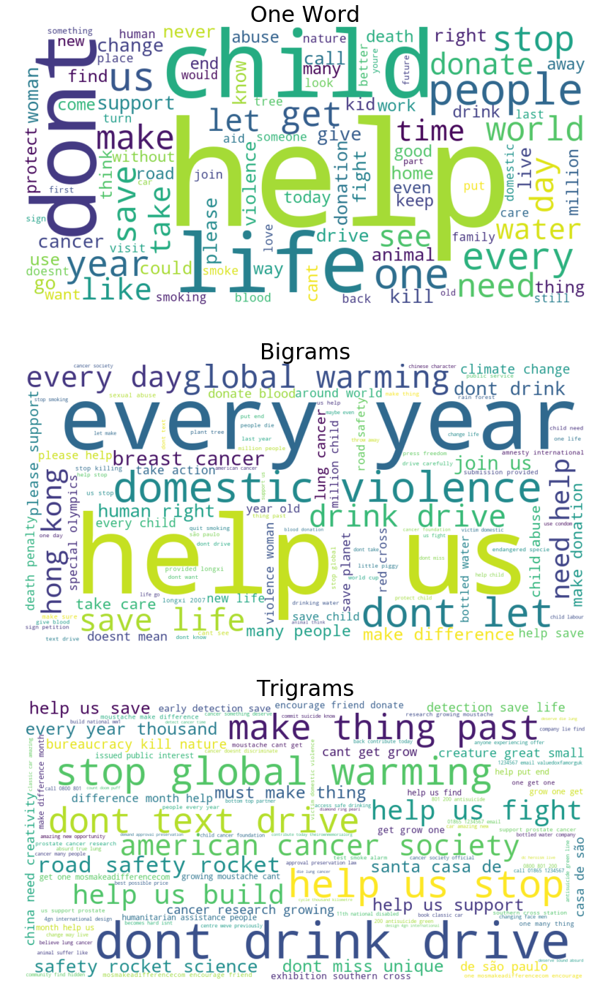

In [10]:
# plotting the word clouds
wc1 = WordCloud(max_words=100, height = 500, width = 1000, background_color='white').generate_from_frequencies(word_freq_dict)
wc2 = WordCloud(max_words=100, height = 500, width = 1000, background_color='white').generate_from_frequencies(bi_freq_dict)
wc3 = WordCloud(max_words=100, height = 500, width = 1000, background_color='white').generate_from_frequencies(tri_freq_dict)
fig, (ax1,ax2,ax3) = plt.subplots(3,1,figsize=(18,24))
ax1.axis('off'), ax2.axis('off'), ax3.axis('off')
ax1.set_title('One Word', fontdict={'fontsize':30}), ax2.set_title('Bigrams', fontdict={'fontsize':30}), 
ax3.set_title('Trigrams', fontdict={'fontsize':30})
ax1.imshow(wc1, interpolation = 'bilinear')
ax2.imshow(wc2, interpolation = 'bilinear')
ax3.imshow(wc3, interpolation = 'bilinear')

In [11]:
# defining functions from code used above to not manually type all of this out every time
def df_word_analyzer(filter_column_variable_name, stop_words, new_stop_words):
    words = headlines.loc[headlines.industry == filter_column_variable_name, 'headline'].ravel()
    tokens = []
    for word in words:
        token = word_tokenize(word)
        tokens+=token
    stop_words += new_stop_words
    stopped = [word for word in tokens if word not in stop_words]
    lemmatizer = nltk.stem.WordNetLemmatizer()
    lemmas = []
    for word in stopped:
        if word != 'us':
            lemma = lemmatizer.lemmatize(word)
            lemmas.append(lemma)
        else:
            lemmas.append(word)
    common_words = Counter(lemmas).most_common(100)
    bigrams = nltk.collocations.BigramAssocMeasures()
    bi_finder = BigramCollocationFinder.from_words(lemmas)
    bi_scored = bi_finder.score_ngrams(bigrams.raw_freq)
    trigrams = nltk.collocations.TrigramAssocMeasures()
    tri_finder = TrigramCollocationFinder.from_words(lemmas)
    tri_scored = tri_finder.score_ngrams(trigrams.raw_freq)
    bi_scored_sort = sorted(bi_scored, key=itemgetter(1), reverse=True)
    tri_scored_sort = sorted(tri_scored, key=itemgetter(1), reverse=True)
    word_freq_dict = {}
    bi_freq_dict = {}
    tri_freq_dict = {}
    for i in range(len(common_words)):
        word_freq_dict[common_words[i][0]] = common_words[i][1]
    for i in range(len(bi_scored_sort)):
        bi_freq_dict[' '.join(bi_scored_sort[i][0])] = bi_scored_sort[i][1]
    for i in range(len(tri_scored_sort)):
        text = ' '.join(tri_scored_sort[i][0])
        if 'longxi' in text:
            pass
        else:
            tri_freq_dict[text] = tri_scored_sort[i][1]
    return word_freq_dict, bi_freq_dict, tri_freq_dict

In [12]:
def word_cloud(word_freq, bigram_freq, trigram_freq):
    wc1 = WordCloud(max_words=100, height = 500, width = 1000, background_color='white').generate_from_frequencies(word_freq)
    wc2 = WordCloud(max_words=100, height = 500, width = 1000, background_color='white').generate_from_frequencies(bigram_freq)
    wc3 = WordCloud(max_words=100, height = 500, width = 1000, background_color='white').generate_from_frequencies(trigram_freq)
    fig, (ax1,ax2,ax3) = plt.subplots(3,1,figsize=(18,24))
    ax1.axis('off'), ax2.axis('off'), ax3.axis('off')
    ax1.set_title('One Word', fontdict={'fontsize':30}), ax2.set_title('Bigrams', fontdict={'fontsize':30}), 
    ax3.set_title('Trigrams', fontdict={'fontsize':30})
    ax1.imshow(wc1, interpolation = 'bilinear')
    ax2.imshow(wc2, interpolation = 'bilinear')
    ax3.imshow(wc3, interpolation = 'bilinear')
    return None

In [13]:
food_stop_words = ['china', 'oreo']
food_word_freq, food_bigram_freq, food_trigram_freq = df_word_analyzer('Food & Beverages', stop_words, food_stop_words)

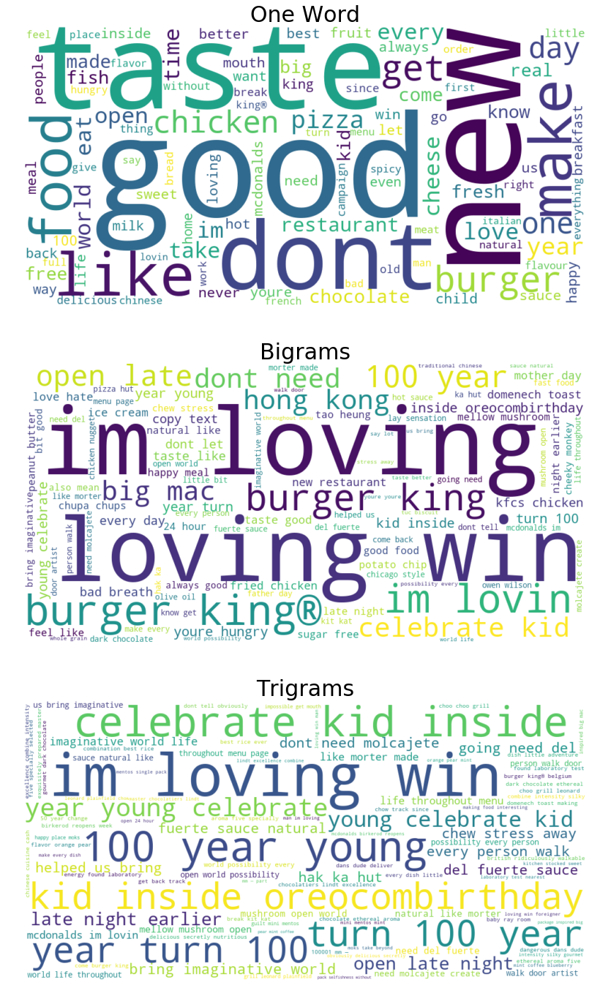

In [14]:
word_cloud(food_word_freq, food_bigram_freq, food_trigram_freq)

In [15]:
headlines.loc[headlines.industry == 'Food & Beverages', 'country'].value_counts()

United States           270
China                   127
Brazil                  126
United Kingdom          117
India                    76
France                   68
Canada                   59
Germany                  55
Australia                47
Spain                    40
Italy                    37
South Africa             31
United Arab Emirates     29
Argentina                26
New Zealand              25
Turkey                   24
Chile                    22
Egypt                    21
Sweden                   21
Singapore                20
Mexico                   20
Switzerland              18
Nigeria                  17
Belgium                  16
Taiwan                   15
Israel                   15
Colombia                 15
Indonesia                13
Austria                  12
Portugal                 10
                       ... 
Slovenia                  5
Uruguay                   5
Venezuela                 4
Lebanon                   4
Tunisia             

In [16]:
car_stop_words = ['volkswagen', 'volvo','peugeot','nissan','mercedesbenz','audi','ford','bmw','jeep','toyota','mini','yaris']
car_word_freq, car_bigram_freq, car_trigram_freq = df_word_analyzer('Automotive & Services', stop_words,car_stop_words)

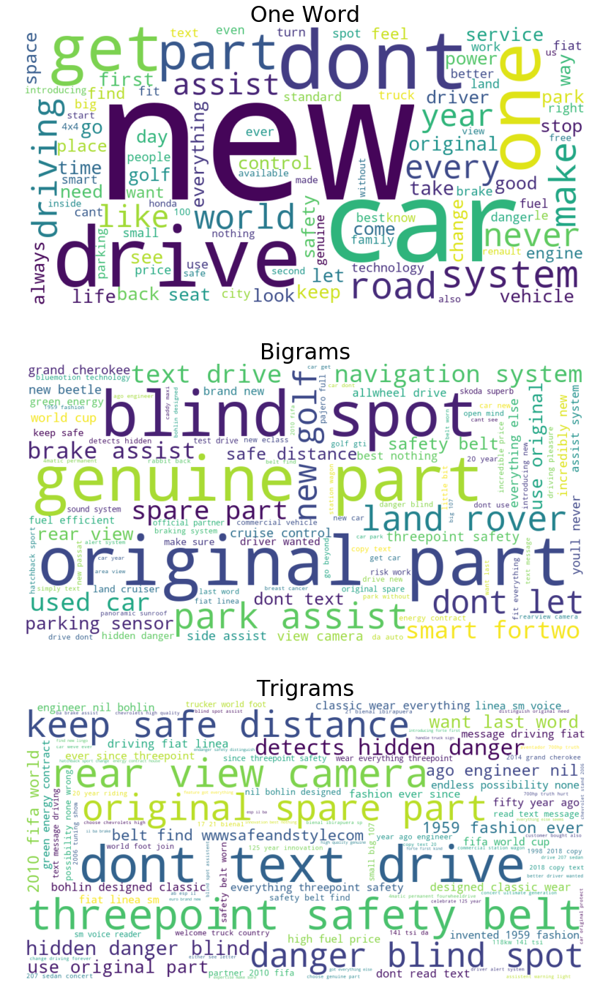

In [17]:
word_cloud(car_word_freq, car_bigram_freq, car_trigram_freq)
plt.savefig('cars_wordcloud.png')

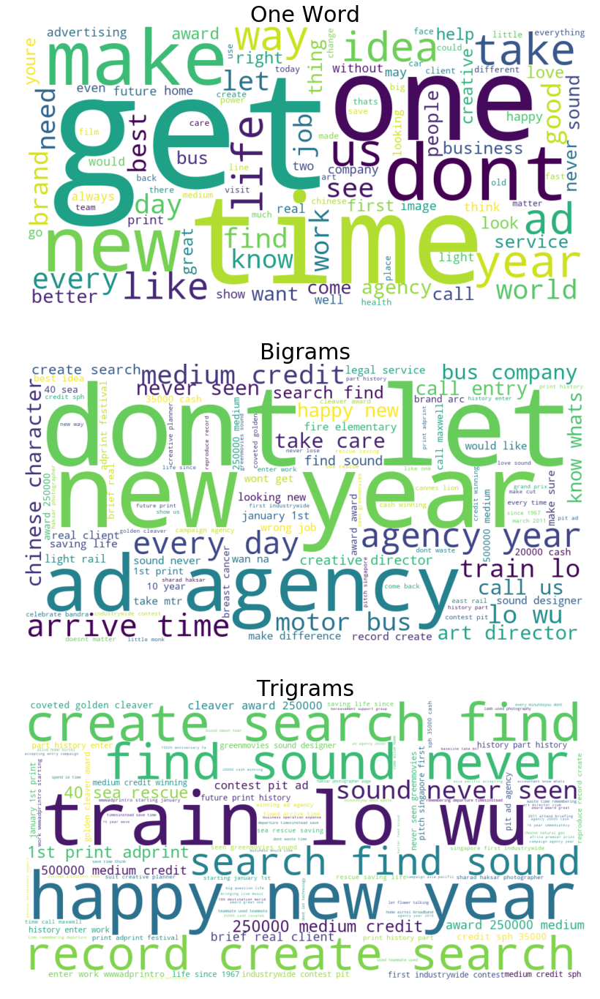

In [24]:
prof_stop_words = ['hong', 'kong', 'lo wu', 'kowloon']
prof_word_freq, prof_bigram_freq, prof_trigram_freq = df_word_analyzer('Professional & Public services', stop_words, prof_stop_words)
word_cloud(prof_word_freq, prof_bigram_freq, prof_trigram_freq)

In [25]:
house_stop_words = ['energizer']
house_word_freq, house_bigram_freq, house_trigram_freq = df_word_analyzer('House, Garden & Pets', stop_words, house_stop_words)

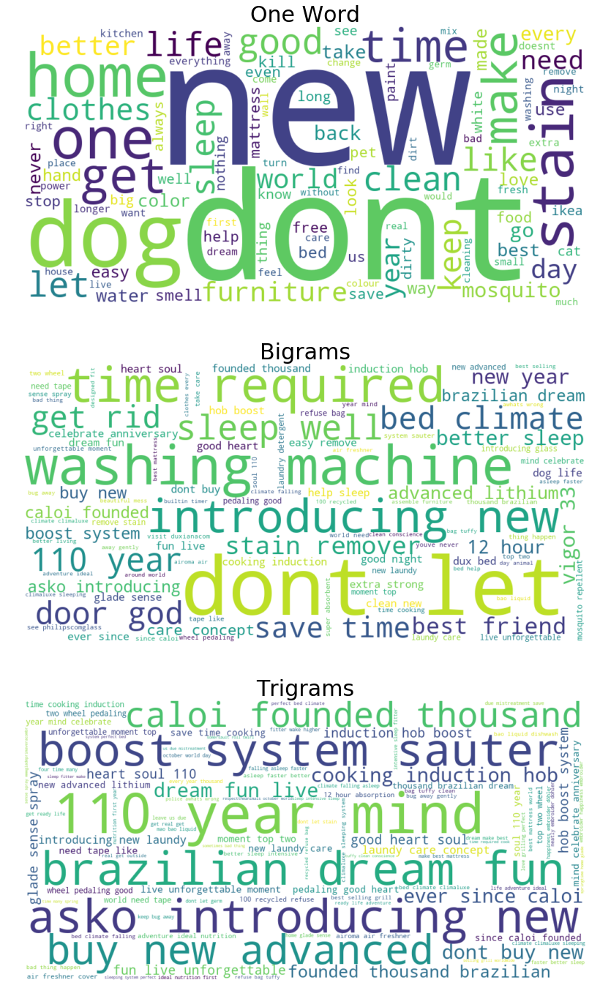

In [26]:
word_cloud(house_word_freq, house_bigram_freq, house_trigram_freq)

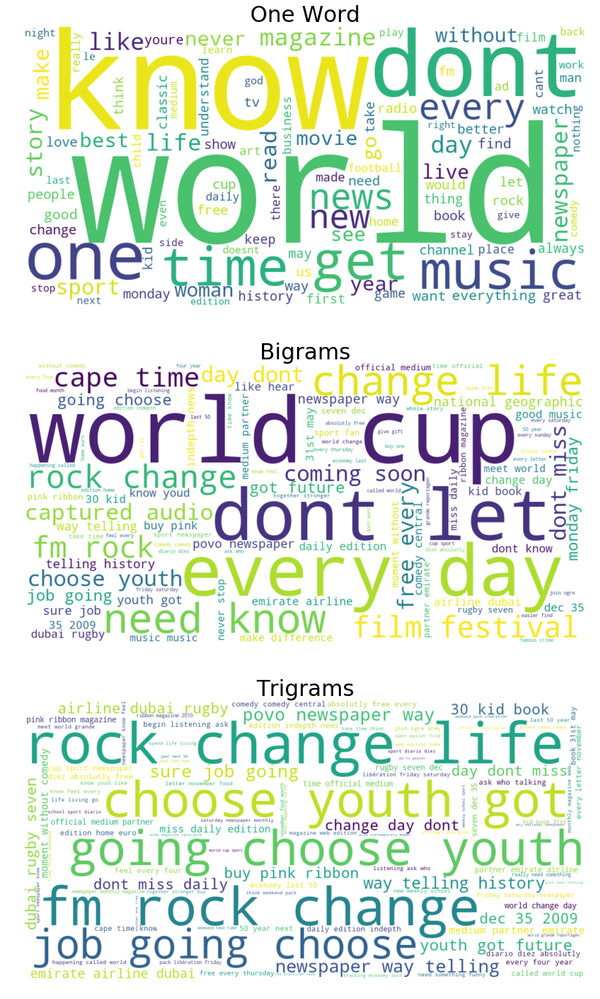

In [27]:
media_stop_words = ['ouï', 'letudiantfr', 'emirate', 'ceará']
media_word_freq, media_bigram_freq, media_trigram_freq = df_word_analyzer('Media & Publishing', stop_words, media_stop_words)
word_cloud(media_word_freq, media_bigram_freq, media_trigram_freq)

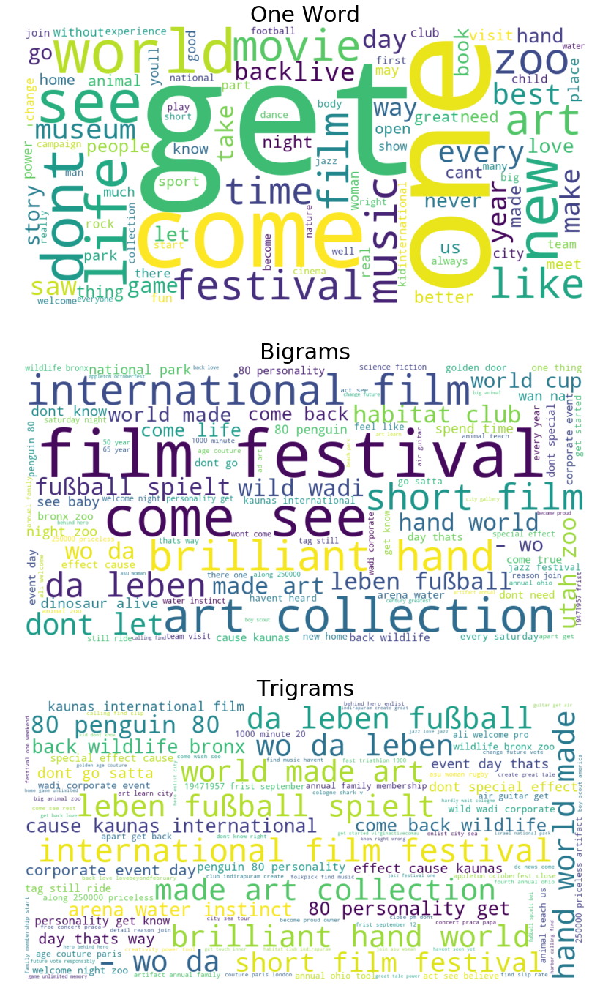

In [28]:
sport_stop_words = ['elbkicktv', 'elbkicktv', 'masp', 'hogle']
sport_word_freq, sport_bigram_freq, sport_trigram_freq = df_word_analyzer('Culture, Recreation & Sport', stop_words, sport_stop_words)
word_cloud(sport_word_freq, sport_bigram_freq, sport_trigram_freq)

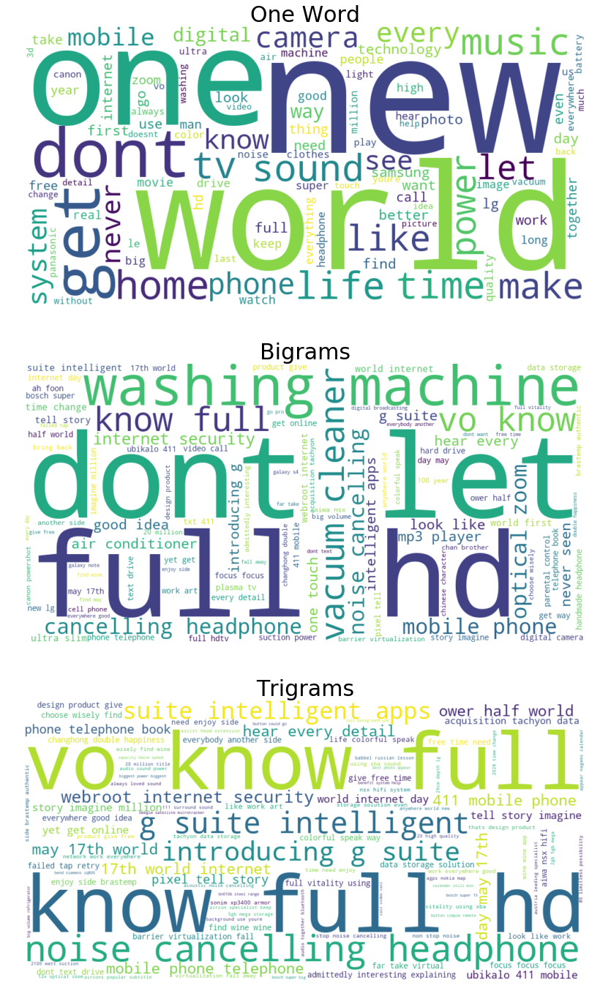

In [29]:
electronics_stop_words = ['sony']
electronics_word_freq, electronics_bigram_freq, electronics_trigram_freq = df_word_analyzer('Electronics & Audio-Visual', stop_words, electronics_stop_words)
word_cloud(electronics_word_freq, electronics_bigram_freq, electronics_trigram_freq)

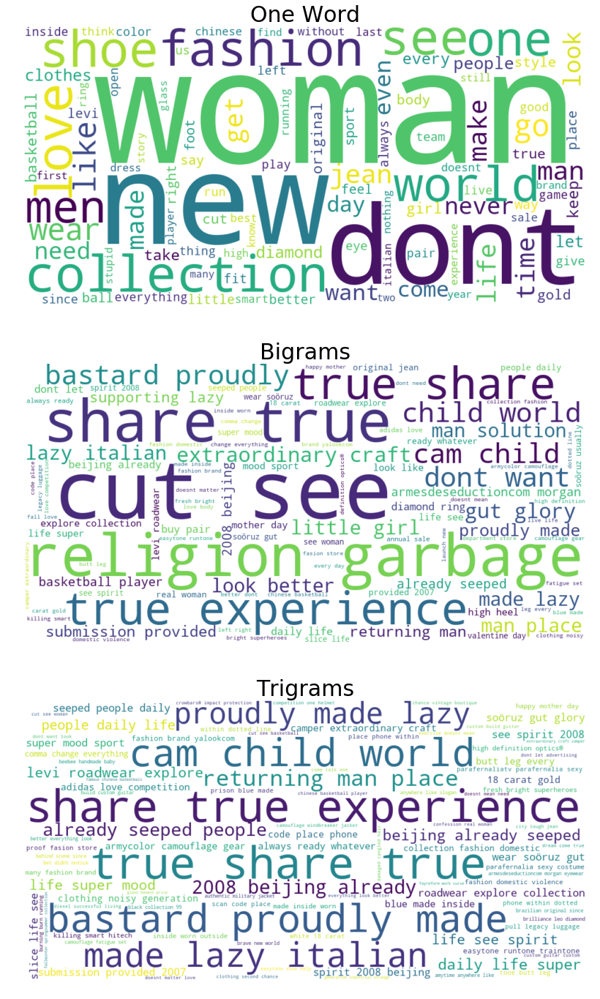

In [30]:
clothes_stop_words = ['gasjeanscom','nike', 'olympics', 'wrangler','michel', 'desjoyeaux','leviscom','levi', 'longxi', '501']
clothes_word_freq, clothes_bigram_freq, clothes_trigram_freq = df_word_analyzer('Apparel, Clothing, Footwear & Accessories', stop_words, clothes_stop_words)
word_cloud(clothes_word_freq, clothes_bigram_freq, clothes_trigram_freq)

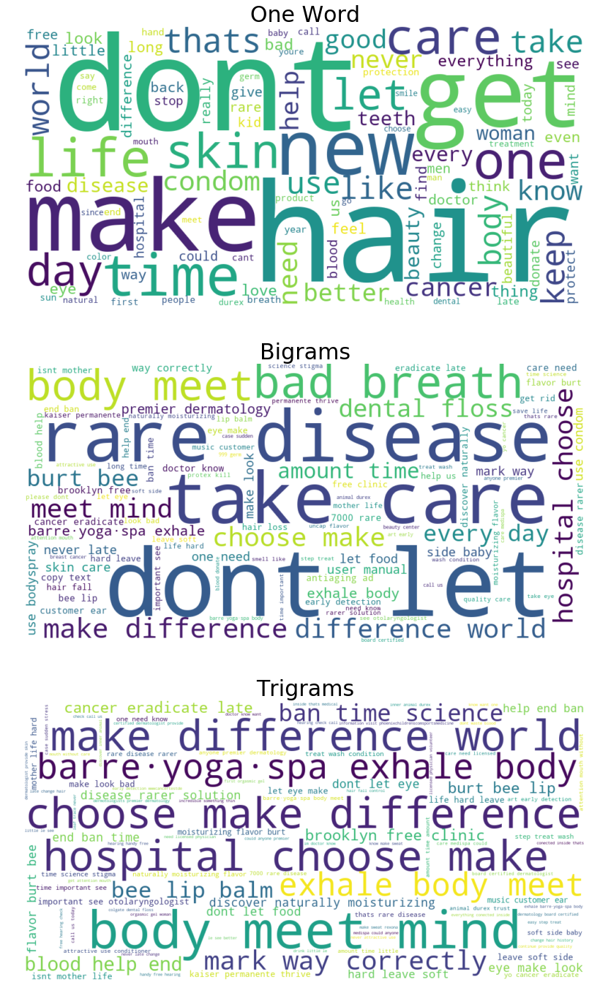

In [31]:
beauty_stop_words = ['mountsinaiorg','axe', 'burt', 'bee']
beauty_word_freq, beauty_bigram_freq, beauty_trigram_freq = df_word_analyzer('Beauty & Health', stop_words, beauty_stop_words)
word_cloud(beauty_word_freq, beauty_bigram_freq, beauty_trigram_freq)

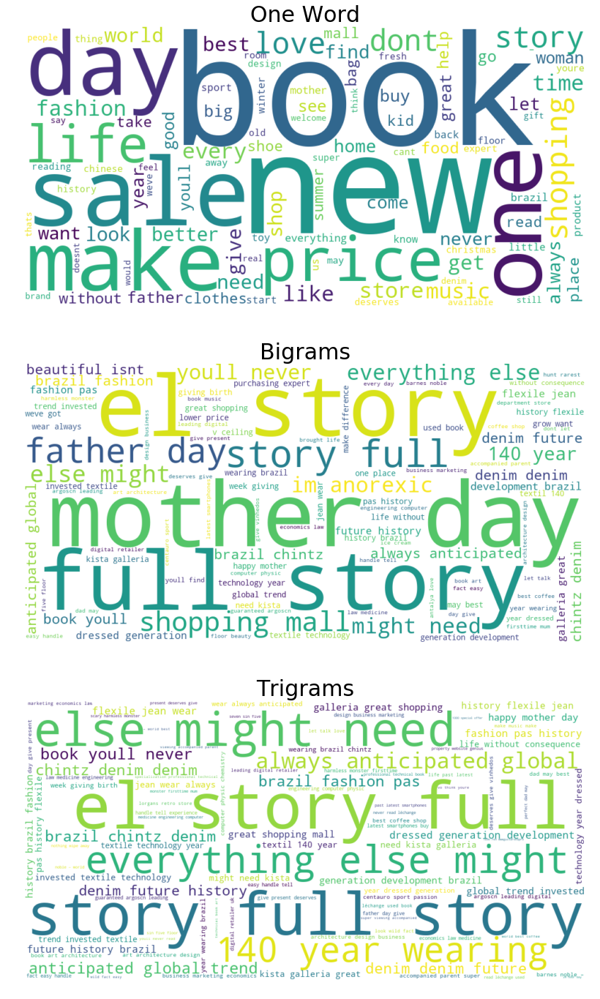

In [32]:
retail_stop_words = ['nichols', 'harvey', 'ateneo', '790', 'ft2', '505', '903', 'cedro']
retail_word_freq, retail_bigram_freq, retail_trigram_freq = df_word_analyzer('Retail & Distribution', stop_words, retail_stop_words)
word_cloud(retail_word_freq, retail_bigram_freq, retail_trigram_freq)

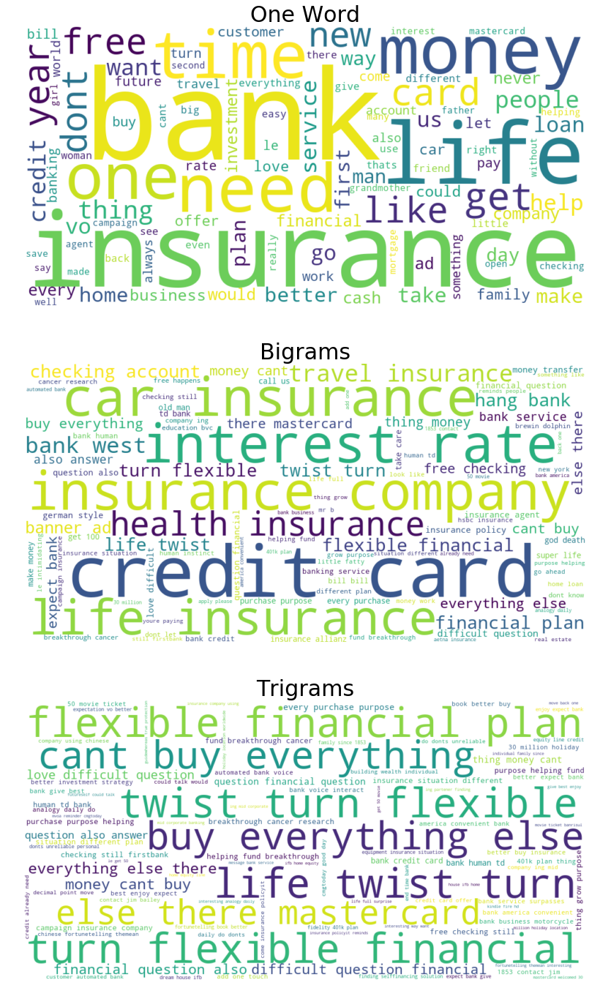

In [33]:
finance_stop_words = ['seng', 'china','fubon']
finance_word_freq, finance_bigram_freq, finance_trigram_freq = df_word_analyzer('Financial & Legal services', stop_words, finance_stop_words)
word_cloud(finance_word_freq, finance_bigram_freq, finance_trigram_freq)

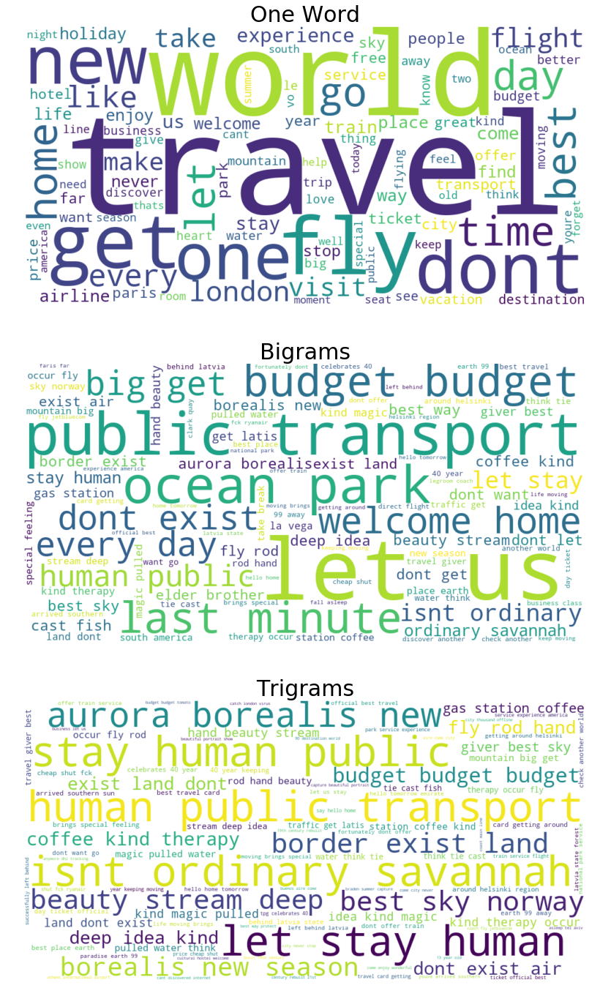

In [34]:
transport_stop_words = ['wwwpowdermountaincom', 'powder', 'rudeville', 'rudechalets']
transport_word_freq, transport_bigram_freq, transport_trigram_freq = df_word_analyzer('Transport & Tourism', stop_words, transport_stop_words)
word_cloud(transport_word_freq, transport_bigram_freq, transport_trigram_freq)

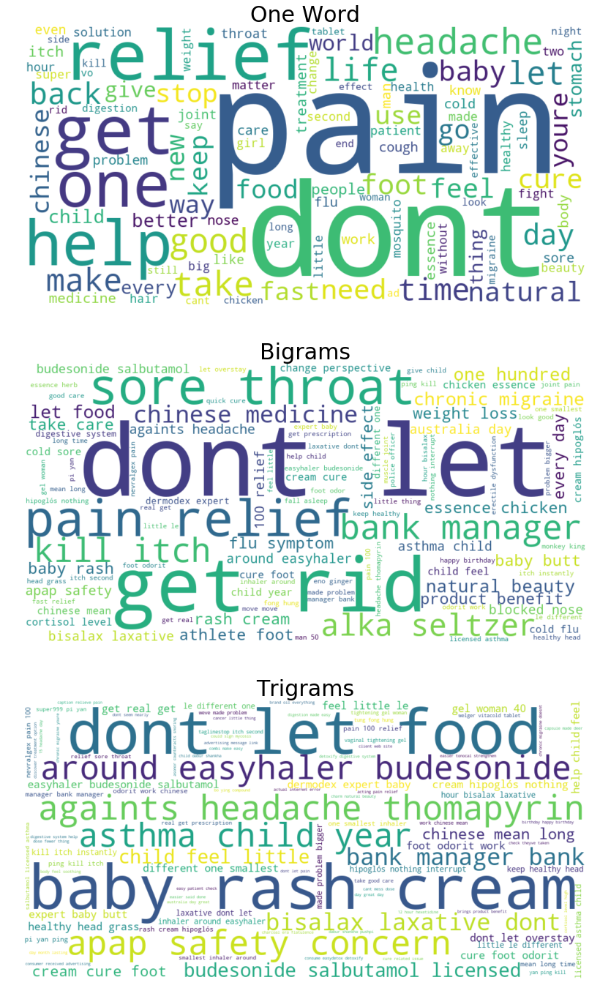

In [35]:
pharma_stop_words = ['999which', '999']
pharma_word_freq, pharma_bigram_freq, pharma_trigram_freq = df_word_analyzer('Pharmaceutical', stop_words, pharma_stop_words)
word_cloud(pharma_word_freq, pharma_bigram_freq, pharma_trigram_freq)

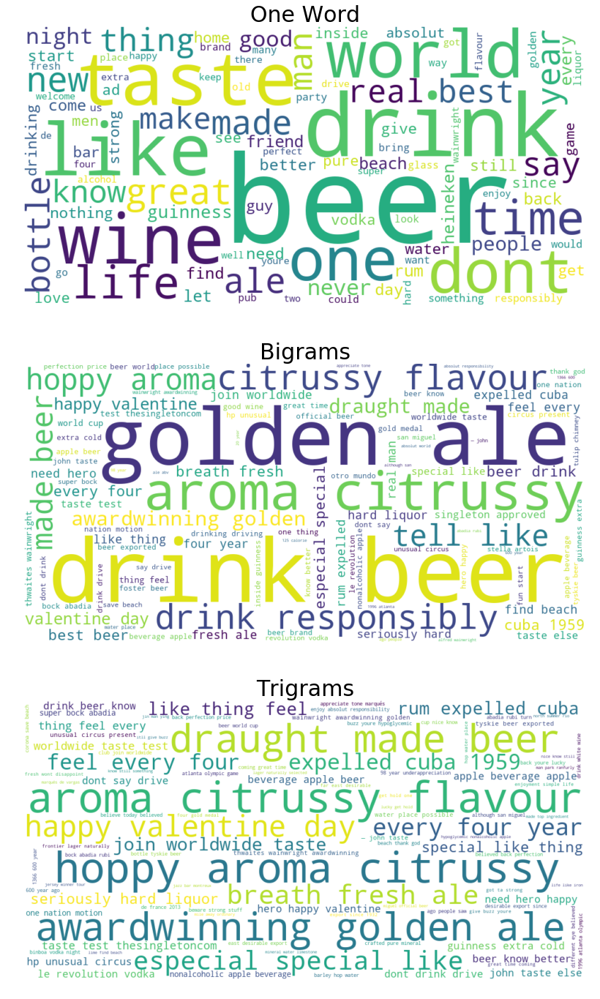

In [36]:
alc_stop_words = ['carlton','eristoff','tsingtao','jameson','matusalem','brahmacom','modelo','guiness']
alc_word_freq, alc_bigram_freq, alc_trigram_freq = df_word_analyzer('Alcoholic drinks', stop_words,alc_stop_words)
word_cloud(alc_word_freq, alc_bigram_freq, alc_trigram_freq)

In [37]:
# examining vocabulary
words = headlines.headline.ravel()
tokens = []
for word in words:
    token = word_tokenize(word)
    tokens+=token
num_words = len(tokens)
num_unique_words = len(set(tokens))
num_words,num_unique_words

(330442, 28423)

In [5]:
w_tokenizer = nltk.tokenize.WhitespaceTokenizer()
lemmatizer = nltk.stem.WordNetLemmatizer()

def clean_text(text):
    return [lemmatizer.lemmatize(w) for w in w_tokenizer.tokenize(text) if w not in stop_words]
headlines['lemmatized_headline'] = headlines.headline.apply(clean_text)

In [6]:
headlines = headlines.rename(columns={'lemmatized_headline':'cleaned_headline'})
headlines.head()

,brand,country,medium,headline,industry,cleaned_headline
0,Tzabar,Israel,Print,roger waters live in paris 3 nights concert €...,Transport & Tourism,"[roger, water, live, paris, night, concert, €6..."
1,Infiniti,United States,Print,accelerating the future,Automotive & Services,"[accelerating, future]"
2,Toyota,Canada,Print,official ride of the spinfest amateur dj awards,Automotive & Services,"[official, ride, spinfest, amateur, dj, award]"
3,Friends of the Earth,Germany,Print,travelling fruits cause pollution think global...,Public interest & Non-profit,"[travelling, fruit, cause, pollution, think, g..."
4,Max Factor,Colombia,Print,the art of beauty,Beauty & Health,"[art, beauty]"


In [7]:
# experimenting with clustering before moving to google colab notebook
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity
text = list(headlines.headline)
tfidf = TfidfVectorizer()
tfidf_matrix = tfidf.fit_transform(text)
doc_dist = 1 - cosine_similarity(tfidf_matrix)

In [52]:
print(tfidf_matrix.shape)

(24232, 28148)


In [8]:
sse = []
for k in tq(range(5,21)):
    km = KMeans(n_clusters=k, verbose=5, n_jobs=-1)
    km.fit(tfidf_matrix)
    sse.append(km.inertia_)

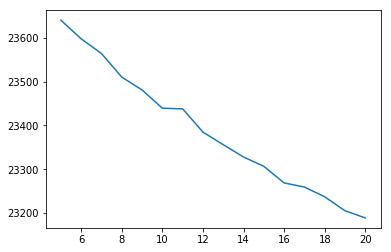

In [9]:
plt.plot(range(5,21), sse)

In [ ]:
# labels = km.labels_.tolist()